In [6]:
import numpy as np
import matplotlib.pyplot as plt
import pyhmc as phmc
import scipy.linalg as la
import os

from scipy.optimize import curve_fit

from iminuit import Minuit

Nt=16
w, h = 3, Nt
n_smear = 5
n_op = 4
n_meas =8000

def E_mass(L,mass):
    return np.arccosh(np.cosh(mass) + 1 -np.cos( 2*np.pi/L) )

def corr_th(x, a,b,c,d):
    E= np.arccosh(2 - np.cos(2*np.pi/Nt))
    return a * np.cosh((x-Nt/2)*b) + c*np.cosh((x-Nt/2)*d)

def variational_analysis(kappa,eigen, eigen_err):
    avg = [0 for i in range(n_smear*n_op)]
    err = [0 for i in range(n_smear*n_op)]
    c_mat = [[0 for i in range(n_smear*n_op) ]for j in range(n_smear*n_op) ]
    c_mat0 = [[0 for i in range(n_smear*n_op) ]for j in range(n_smear*n_op) ]
    c_plus = [[0 for i in range(n_smear*n_op) ]for j in range(n_smear*n_op) ]
    c_minus = [[0 for i in range(n_smear*n_op) ]for j in range(n_smear*n_op) ]
    avg_np= np.loadtxt('cross_new/matrix_c_L%d_k%f.txt' %(Nt,kappa))
    avg_np=avg_np.reshape(Nt,n_smear*n_op,n_smear*n_op)
    err_np= np.loadtxt('cross_new/matrix_c_L%d_k%f_err.txt' %(Nt,kappa))
    err_np=err_np.reshape(Nt,n_smear*n_op,n_smear*n_op)
    
    for t in range(Nt):
        eigen.append([])
        eigen_err.append([])
        for i in range(n_smear*n_op):
            for j in range(n_smear*n_op):
                if t == 0:
                    c_mat0[i][j] = avg_np[t][i][j]
                c_mat[i][j] = avg_np[t][i][j]
                c_plus[i][j] = avg_np[t][i][j] + err_np[t][i][j]
                c_minus[i][j] = avg_np[t][i][j] - err_np[t][i][j]
        
        v,w = la.eig(c_mat,b=c_mat0)
        p,l = la.eig(c_plus,b=c_mat0)
        m,r = la.eig(c_minus,b=c_mat0)
        if t>0:
            v[::-1].sort()
            p[::-1].sort()
            m[::-1].sort()
        for i in range(n_op*n_smear):
            if p[i].real > v[i].real and p[i].real > m[i].real:
                if v[i].real > m[i].real:
                    avg[i] = v[i].real
                    err[i] = (p[i].real - m[i].real)/2
                if m[i].real > v[i].real:
                    avg[i] = m[i].real
                    err[i] = (p[i].real -v[i].real)/2
            if v[i].real > p[i].real and v[i].real > m[i].real:
                if p[i].real > m[i].real:
                    avg[i] = p[i].real
                    err[i] = (v[i].real - m[i].real)/2
                if m[i].real > p[i].real:
                    avg[i] = m[i].real
                    err[i] = (v[i].real -p[i].real)/2
            if m[i].real > v[i].real and m[i].real > p[i].real:
                if v[i].real > p[i].real:
                    avg[i] = v[i].real
                    err[i] = (m[i].real - p[i].real)/2
                if p[i].real > v[i].real:
                    avg[i] = p[i].real
                    err[i] = (m[i].real - v[i].real)/2
            eigen[t].append(avg[i])
            eigen_err[t].append(err[i])


def variational_analysis4(kappa,eigen, eigen_err,n_s):
    avg = [0 for i in range(4)]
    err = [0 for i in range(4)]
    index =[n_s,n_s+n_smear,n_s+n_smear*2,n_s+n_smear*3]
    c_mat = [[0 for i in range(4) ]for j in range(4) ]
    c_mat0 = [[0 for i in range(4) ]for j in range(4) ]
    c_plus = [[0 for i in range(4) ]for j in range(4) ]
    c_minus = [[0 for i in range(4) ]for j in range(4) ]
    avg_np= np.loadtxt('cross_new/matrix_c_L%d_k%f.txt' %(Nt,kappa))
    avg_np=avg_np.reshape(Nt,n_smear*n_op,n_smear*n_op)
    err_np= np.loadtxt('cross_new/matrix_c_L%d_k%f_err.txt' %(Nt,kappa))
    err_np=err_np.reshape(Nt,n_smear*n_op,n_smear*n_op)
    
    for t in range(Nt):
        eigen.append([])
        eigen_err.append([])
        for i in range(4):
            for j in range(4):
                if t == 0:
                    c_mat0[i][j] = avg_np[t][index[i]][index[j]]
                c_mat[i][j] = avg_np[t][index[i]][index[j]]
                c_plus[i][j] = avg_np[t][index[i]][index[j]] + err_np[t][index[i]][index[j]]
                c_minus[i][j] = avg_np[t][index[i]][index[j]] - err_np[t][index[i]][index[j]]
                '''
        with open('cross/matrix_3_L%d_k%f_ns%d_t%d.txt' %(Nt,kappa,n_s,t),'w')  as outfile:
            with open('cross/matrix_3_L%d_k%f_ns%d_t%d_plus.txt'%(Nt,kappa,n_s,t),'w') as plusfile:
                with open('cross/matrix_3_L%d_k%f_ns%d_t%d_minus.txt'%(Nt,kappa,n_s,t),'w') as minusfile:
                    np.savetxt(outfile ,c_mat,fmt='%.6f')
                    #outfile.write('# New time slice\n')
                    np.savetxt(plusfile ,c_plus,fmt='%.6f')
                    #plusfile.write('# New time slice\n')
                    np.savetxt(minusfile ,c_minus,fmt='%.6f')   
                    '''
        v,w = la.eig(c_mat,b=c_mat0)
        p,l = la.eig(c_plus,b=c_mat0)
        m,r = la.eig(c_minus,b=c_mat0)
        if t>0:
            v[::-1].sort()
            p[::-1].sort()
            m[::-1].sort()
        for i in range(4):
            if p[i].real > v[i].real and p[i].real > m[i].real:
                if v[i].real > m[i].real:
                    avg[i] = v[i].real
                    err[i] = (p[i].real - m[i].real)/2
                if m[i].real > v[i].real:
                    avg[i] = m[i].real
                    err[i] = (p[i].real -v[i].real)/2
            if v[i].real > p[i].real and v[i].real > m[i].real:
                if p[i].real > m[i].real:
                    avg[i] = p[i].real
                    err[i] = (v[i].real - m[i].real)/2
                if m[i].real > p[i].real:
                    avg[i] = m[i].real
                    err[i] = (v[i].real -p[i].real)/2
            if m[i].real > v[i].real and m[i].real > p[i].real:
                if v[i].real > p[i].real:
                    avg[i] = v[i].real
                    err[i] = (m[i].real - p[i].real)/2
                if p[i].real > v[i].real:
                    avg[i] = p[i].real
                    err[i] = (m[i].real - v[i].real)/2
            eigen[t].append(avg[i])
            eigen_err[t].append(err[i])
            
def variational_analysis3(kappa,eigen, eigen_err,n_s,n2):
    avg = [0 for i in range(4)]
    err = [0 for i in range(4)]
    index =[n_s,n_s+5,n_s+10,n_s+15]
    c_mat0 = [[0 for i in range(4) ]for j in range(4) ]
    #eigen_err = [0 for t in range(Nt)]
    #c_plus0 = [[0 for i in range(n_smear*n_op) ]for j in range(n_smear*n_op) ]
    #c_minus0 = [[0 for i in range(n_smear*n_op) ]for j in range(n_smear*n_op) ]
    avg_np= np.loadtxt('cross_new/matrix_c_L%d_k%f.txt' %(Nt,kappa))
    avg_np=avg_np.reshape(Nt,n_smear*n_op,n_smear*n_op)
    #print(avg)
    err_np= np.loadtxt('cross_new/matrix_c_L%d_k%f_err.txt' %(Nt,kappa))
    err_np=err_np.reshape(Nt,n_smear*n_op,n_smear*n_op)
    
    for t in range(Nt):
        c_mat = [[0 for i in range(4) ]for j in range(4) ]
        c_plus = [[0 for i in range(4) ]for j in range(4) ]
        c_minus = [[0 for i in range(4) ]for j in range(4) ]
        eigen.append([])
        eigen_err.append([])
        for i in range(4):
            for j in range(4):
                if t == 0:
                    #c_mat0[i][j] = c_mat[0][i][j][t]
                    c_mat0[i][j] = avg_np[t][index[i]][index[j]]
                    #c_plus0[i][j] = c_res[0][i][j][t] + c_res[1][i][j][t]
                    #c_minus0[i][j] = c_res[0][i][j][t] - c_res[1][i][j][t]
                c_mat[i][j] = avg_np[t][index[i]][index[j]]
                #c_mat_err[i][j] = c_res[1][i][j][t]
                c_plus[i][j] = avg_np[t][index[i]][index[j]] + err_np[t][index[i]][index[j]]
                c_minus[i][j] = avg_np[t][index[i]][index[j]] - err_np[t][index[i]][index[j]]
    
        #print('t= '+str(t)+str(check_symmetric(c_mat)))
        #print(c_mat)
        [j.pop(n2) for j in c_mat]
        c_mat.pop(n2)
        if t == 0:
            [j.pop(n2) for j in c_mat0]
            c_mat0.pop(n2)
        [j.pop(n2) for j in c_plus]
        c_plus.pop(n2)
        [j.pop(n2) for j in c_minus]
        c_minus.pop(n2)
        '''
        with open('cross/matrix_4_L%d_k%f_ns%d_n%d_t%d.txt' %(Nt,kappa,n_s,n2,t),'w')  as outfile:
            with open('cross/matrix_4_L%d_k%f_ns%d_n%d_t%d_plus.txt'%(Nt,kappa,n_s,n2,t),'w') as plusfile:
                with open('cross/matrix_4_L%d_k%f_ns%d_n%d_t%d_minus.txt'%(Nt,kappa,n_s,n2,t),'w') as minusfile:
                    np.savetxt(outfile ,c_mat,fmt='%.6f')
                    #outfile.write('# New time slice\n')
                    np.savetxt(plusfile ,c_plus,fmt='%.6f')
                    #plusfile.write('# New time slice\n')
                    np.savetxt(minusfile ,c_minus,fmt='%.6f')
        '''
        v,w = la.eig(c_mat,b=c_mat0)
        p,l = la.eig(c_plus,b=c_mat0)
        m,r = la.eig(c_minus,b=c_mat0)
        if t >0:
            v[::-1].sort()
            p[::-1].sort()
            m[::-1].sort()
        #print('v = ',v)
        #print('p = ',p)
        #print('m = ',m)
        for i in range(3):
            if p[i].real > v[i].real and p[i].real > m[i].real:
                if v[i].real > m[i].real:
                    avg[i] = v[i].real
                    err[i] = (p[i].real - m[i].real)/2
                if m[i].real > v[i].real:
                    avg[i] = m[i].real
                    err[i] = (p[i].real -v[i].real)/2
            if v[i].real > p[i].real and v[i].real > m[i].real:
                if p[i].real > m[i].real:
                    avg[i] = p[i].real
                    err[i] = (v[i].real - m[i].real)/2
                if m[i].real > p[i].real:
                    avg[i] = m[i].real
                    err[i] = (v[i].real -p[i].real)/2
            if m[i].real > v[i].real and m[i].real > p[i].real:
                if v[i].real > p[i].real:
                    avg[i] = v[i].real
                    err[i] = (m[i].real - p[i].real)/2
                if p[i].real > v[i].real:
                    avg[i] = p[i].real
                    err[i] = (m[i].real - v[i].real)/2
            eigen[t].append(avg[i])
            eigen_err[t].append(err[i])
        #print('Eigenvalue problem solved without the operator',n2)
        #print(t,'Eigenvalues: ',eigen[t], 'Errors: ',eigen_err[t])
    #print(eigen)

def plot_energy_var(kappa,Eigen,Eigen_err,n_eigen,n_s,n1,n2):
    Tm = list(range(Nt-1))
    T= list(range(Nt))
    C = list(range(Nt))
    C_err = list(range(Nt))

    E_p= list(range(Nt-1))
    E_p2= list(range(Nt-1))
    E_m=list(range(Nt-1))
    E_c = 2*np.pi/Nt
    E_l= np.arccosh(2-np.cos(E_c))
    E_l2= np.arccosh(2-np.cos(2*E_c))
    x = np.arange(Nt-1)
    xdata = np.linspace(0,Nt-1,50)

    for t in range(Nt-1):
        E_p[t]=np.log(np.cosh(E_l*(t-Nt/2))/np.cosh(E_l*(t+1-Nt/2)))
        E_p2[t]=np.log(np.cosh(E_l2*(t-Nt/2))/np.cosh(E_l2*(t+1-Nt/2)))
        if kappa == 0.55:
            E_m[t] =np.log(np.cosh(E_mass(Nt,0.5)*(t-Nt/2))/np.cosh(E_mass(Nt,0.5)*(t+1-Nt/2)))
        if kappa == 0.65:
            E_m[t] =np.log(np.cosh(E_mass(Nt,1)*(t-Nt/2))/np.cosh(E_mass(Nt,1)*(t+1-Nt/2)))
        
        
    for ns in range(n_eigen):
        E = list(range(Nt-1))
        E_unc = list(range(Nt-1))
        for t in range(Nt):
            C[t] = float(Eigen[t][ns])
            C_err[t] = float(Eigen_err[t][ns])
        for t in range(Nt-1):
            Tm[t] = t +0.5
            E[t] = np.log(C[t]/C[t+1])
            E_unc[t] = np.sqrt( (C_err[t]/C[t])**2 + (C_err[t+1]/C[t+1])**2 )
            #if E_unc[t] > np.abs(E[t]):
            #    E[t] = np.log(-1)
                
        #C_fit=np.array(C)
        #print('E(before)=',E)
        
        #C_fit_err=np.array(C_err)
        #print(E_unc)
        t=np.linspace(0,Nt-2,Nt-1)
        #print('t(before)=',t)
        for i in range(Nt-2,-1,-1):
            if E_unc[i] > np.abs(E[i]):
                E=np.delete(E,i)
                E_unc=np.delete(E_unc,i)
                t=np.delete(t,i)
        E=np.delete(E,0)
        E_unc=np.delete(E_unc,0)
        t=np.delete(t,0)
        t=t+0.5
        #print('t(after)=',t)
        #print('E(after)=',E)

        def least_squares(a, b,c,d):
            return sum((E - np.log(corr_th(t, a, b,c,d)/corr_th(t+1, a, b,c,d) )) ** 2 / (E_unc*E_unc))

        #C_fit.pop(0)
        #C_fit_err.pop(0)
        #with open('O1minus/Energy/var%d/effective_energy_L%d_k%f_sm%d_n1_%d_n2_%d_lv%d.dat'% (n_eigen,Nt,kappa,n_s,n1,n2,ns),'w') as f:
        #    for t in list(range(Nt-1)):
        #        f.write(str(Tm[t])+" ")
        #        f.write(str(E[t])+" ")
        #        f.write(str(float(E_unc[t]))+"\n")
        
        
        plt.figure(num=None, figsize=(8, 6), dpi=160, facecolor='w', edgecolor='k')
        try:
            #popt, pcov = curve_fit(corr_th, T, C,sigma = C_err, absolute_sigma = True,bounds =([0.0001,0,0,0],[4.0,2,1,6]))
            #plt.plot(xdata +0.5, np.log(corr_th(xdata, *popt)/corr_th(xdata +1, *popt)),label=r'fit, $E_1 = %f\pm %f, E_2= %f \pm %f$' %(popt[1],np.sqrt(pcov[1][1]),popt[3],np.sqrt(pcov[3][3])))
            
            m = Minuit(least_squares,a=1,b=0.5,c=0.1,d=1,error_a=0.1,error_b=0.05,error_c=0.01,error_d=0.1,limit_a=(0,10),limit_b=(0,2),limit_c=(0,10),limit_d=(0,5),errordef=0.5)
            m.migrad()
            plt.plot(xdata +0.5, np.log(corr_th(xdata, *m.args)/corr_th(xdata +1, *m.args)),label=r'fit, $E=%f \pm %f,E_{ex}= %f \pm %f$'%(m.args[1],m.errors[1],m.args[3],m.errors[3]))
            print(m.args)
            print(m.errors)
        except RuntimeError:
            print("Error - curve_fit failed")

        plt.errorbar(t, E,E_unc,fmt='o',label='data')
        plt.plot(x+0.5,E_p,label='$E_{th}$')
        plt.plot(x+0.5,E_p2,label='$E2_{th}$')
        if kappa == 0.55 or kappa == 0.65:
            plt.plot(x+0.5,E_m,label='$E_{m}$')
        plt.xlabel("t/a")
        plt.ylabel("a E(t)")
        #plt.yscale("log")
        plt.legend()
        plt.xlim([0.5,Nt/2+1])
        #plt.ylim([-0.5,1.0])
        #print(n_eigen)
        if n_eigen == n_smear*n_op:
            plt.title(r"Effective energy eigenvalue %d, L=%d ($\beta=4, \kappa=%f, \lambda=1 $)" % (ns,Nt,kappa))
            #plt.savefig('O1minus/Energy_2/var%d/effective_energy_L%d_k%f_lv%d.jpg'% (n_eigen,Nt,kappa,ns))
        if n_eigen == 20:
            plt.title(r"Effective energy eigenvalue %d, L=%d ($\beta=4, \kappa=%f, \lambda=1 $)" % (ns,Nt,kappa))
            #plt.savefig('O1minus/Energy_2/var%d/effective_energy_L%d_k%f_lv%d.jpg'% (n_eigen,Nt,kappa,ns))
        if n_eigen == 4:
            plt.title(r"Effective energy eigenvalue %d smear %d, L=%d ($\beta=4, \kappa=%f, \lambda=1 $)" % (ns,n_s,Nt,kappa))
            #plt.savefig('O1minus/Energy_2/var%d/effective_energy_L%d_k%f_sm%d_lv%d.jpg'% (n_eigen,Nt,kappa,n_s,ns))        
        if n_eigen == 3:
            plt.title(r"Effective energy eigenvalue %d smear %d without %d, L=%d ($\beta=4, \kappa=%f, \lambda=1 $)" % (ns,n_s,n1,Nt,kappa))
            #plt.savefig('O1minus/Energy_2/var%d/effective_energy_L%d_k%f_sm%d_n1_%d_lv%d.jpg'% (n_eigen,Nt,kappa,n_s,n1,ns))
        if n_eigen == 2:
            plt.title(r"Effective energy eigenvalue %d smear %d without %d,%d, L=%d ($\beta=4, \kappa=%f, \lambda=1 $)" % (ns,n_s,n1,n2,Nt,kappa))
            #plt.savefig('O1minus/Energy_2/var%d/effective_energy_L%d_k%f_sm%d_n1_%d_n2_%d_lv%d.jpg'% (n_eigen,Nt,kappa,n_s,n1,n2,ns))

def var_analysis_plot(kappa):
    Eigen =[]
    Eigen_err=[]
    variational_analysis(kappa,Eigen,Eigen_err)
    plot_energy_var(kappa,Eigen,Eigen_err,n_smear*n_op,0,0,0)

def var_analysis_plot4(kappa,n_s):
    Eigen =[]
    Eigen_err=[]
    variational_analysis4(kappa,Eigen,Eigen_err,n_s)
    plot_energy_var(kappa,Eigen,Eigen_err,4,n_s,0,0)

def var_analysis_plot3(kappa,ns,n1):
    Eigen =[]
    Eigen_err=[]
    variational_analysis3(kappa,Eigen,Eigen_err,ns,n1)
    #print(Eigen)
    plot_energy_var(kappa,Eigen,Eigen_err,3,ns,n1,0)

<ArgsView of Minuit at 55f47616fda8>
  0.4916698399880398
  0.7273631300383627
  0.052127406589237424
  0.7275683926960924
<ErrorView of Minuit at 55f47616fda8>
  a: 7.274743504670079
  b: 0.005958971359388721
  c: 9.683257161050483
  d: 0.6913148123285663
<ArgsView of Minuit at 55f4760e77a8>
  0.33684144901541424
  0.7755813249285403
  0.04124607605387243
  0.7757465975056856
<ErrorView of Minuit at 55f4760e77a8>
  a: 9.643028710122703
  b: 0.004082319816792468
  c: 9.936830192067763
  d: 0.2907868162877487
<ArgsView of Minuit at 55f47605e238>
  0.2097871658295486
  0.7668338843384656
  0.03486773265058252
  0.7672440420024453
<ErrorView of Minuit at 55f47605e238>
  a: 7.733900556343684
  b: 0.011151378765954068
  c: 5.1073177231112314
  d: 0.5191544863954451
<ArgsView of Minuit at 55f4760e77a8>
  0.297071933343529
  0.777047650882815
  0.07354459276920688
  0.7774502844312634
<ErrorView of Minuit at 55f4760e77a8>
  a: 6.904926023863636
  b: 0.015403956738333668
  c: 9.246711378486722

/home/vincenzo/Documents/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:268: RuntimeWarning: invalid value encountered in log


<ArgsView of Minuit at 55f47616fda8>
  nan
  nan
  nan
  nan
<ErrorView of Minuit at 55f47616fda8>
  a: nan
  b: nan
  c: nan
  d: nan
<ArgsView of Minuit at 55f4760e77a8>
  nan
  nan
  nan
  nan
<ErrorView of Minuit at 55f4760e77a8>
  a: nan
  b: nan
  c: nan
  d: nan


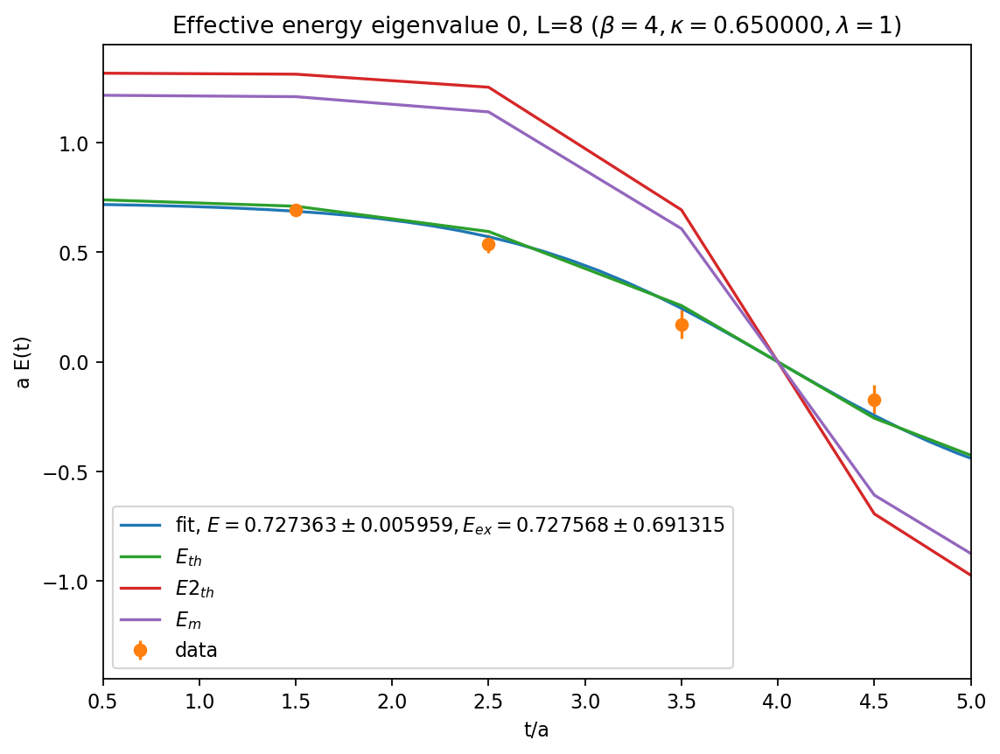

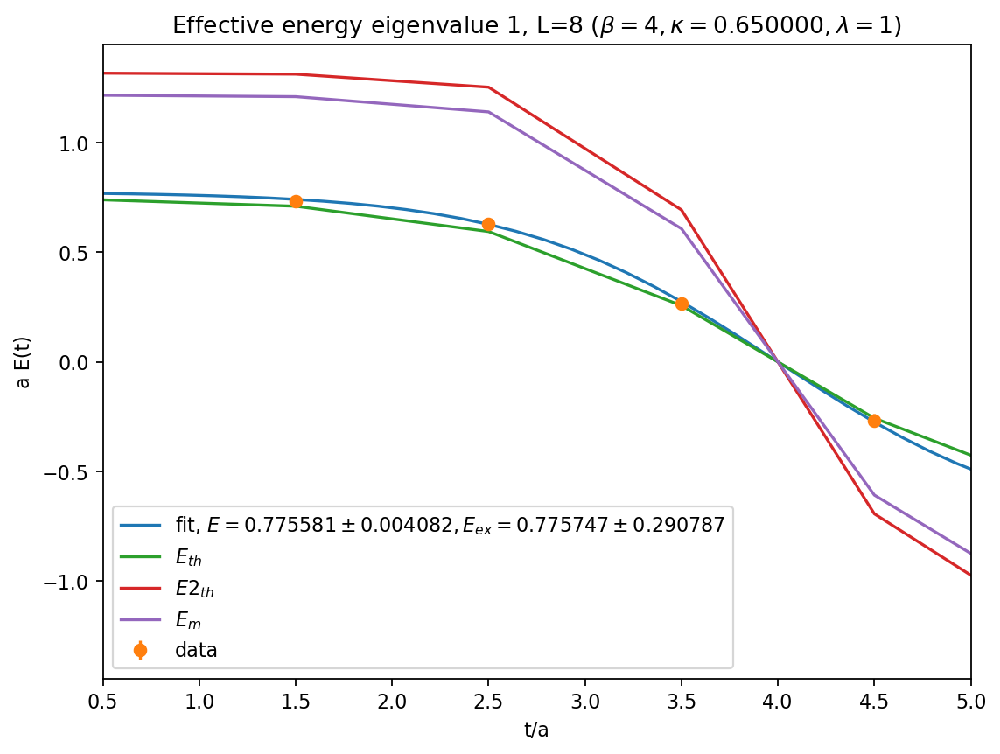

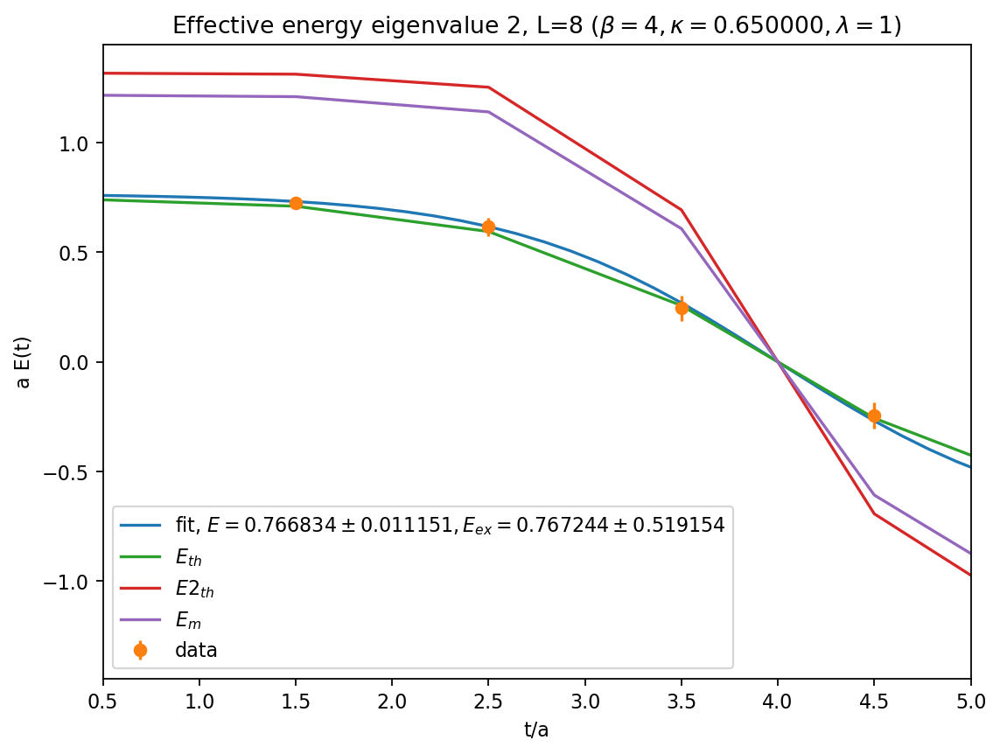

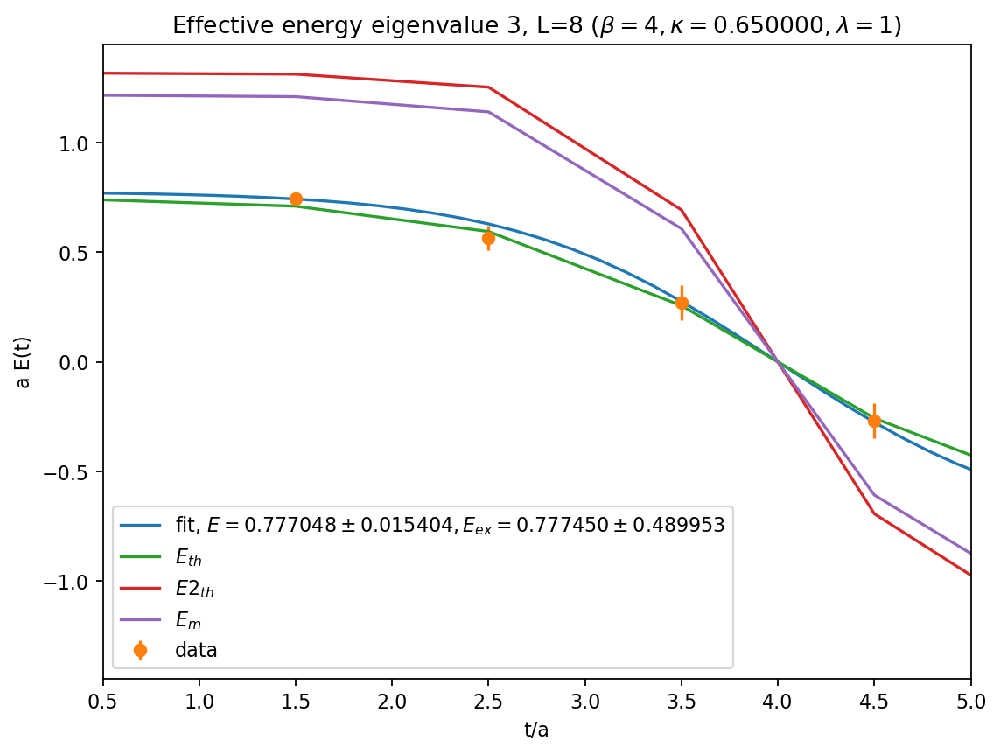

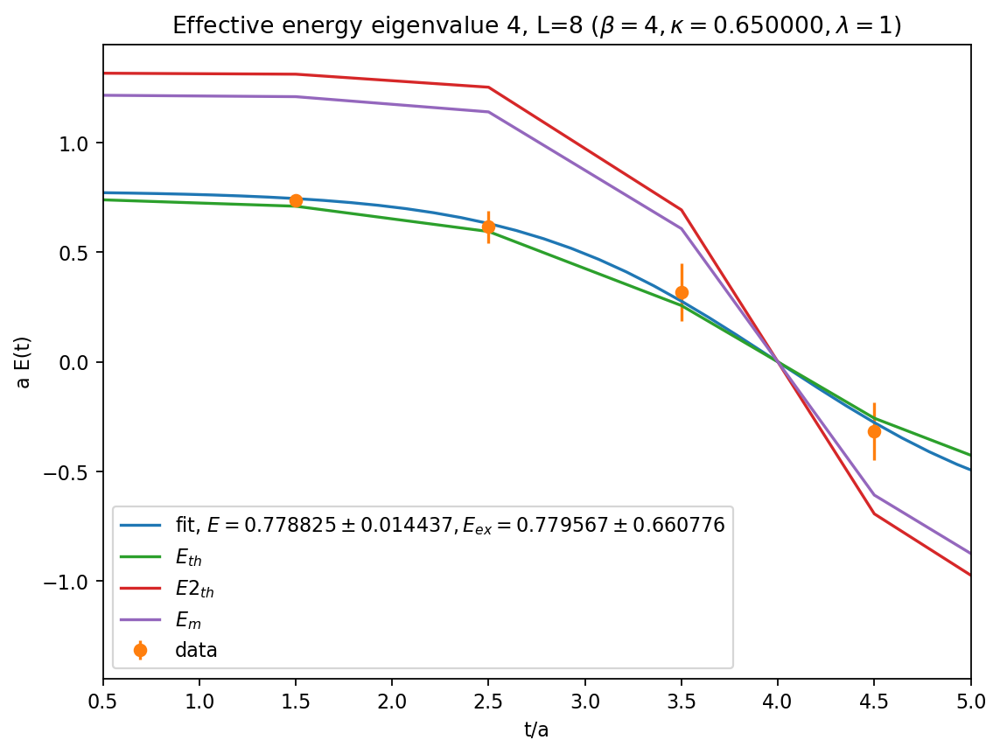

...

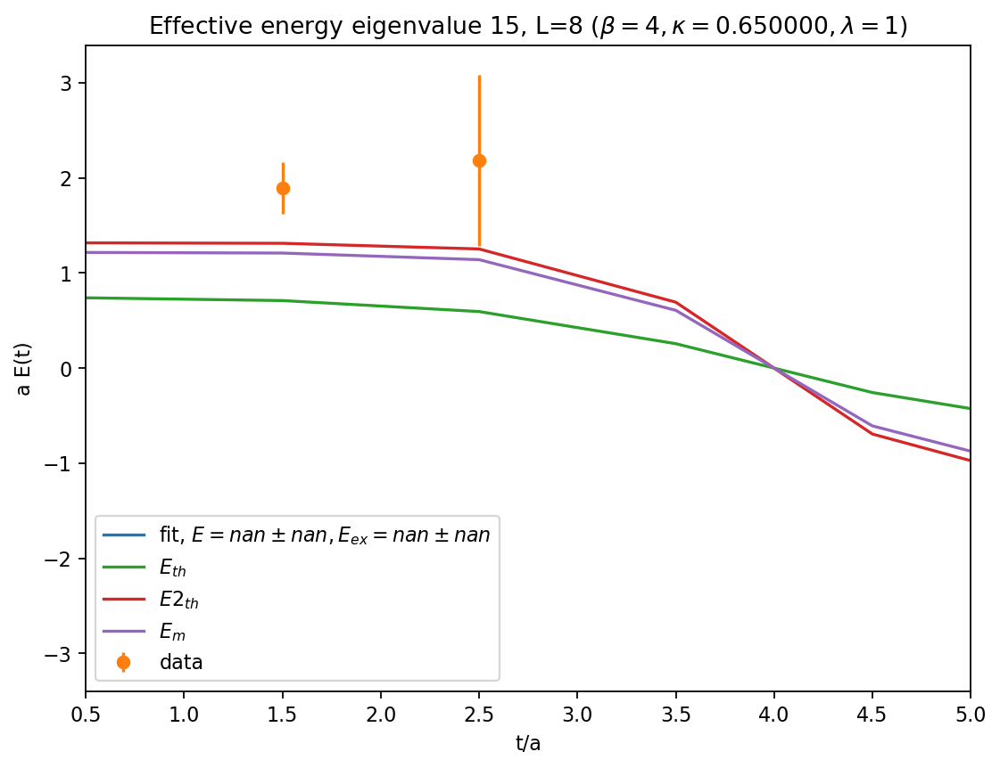

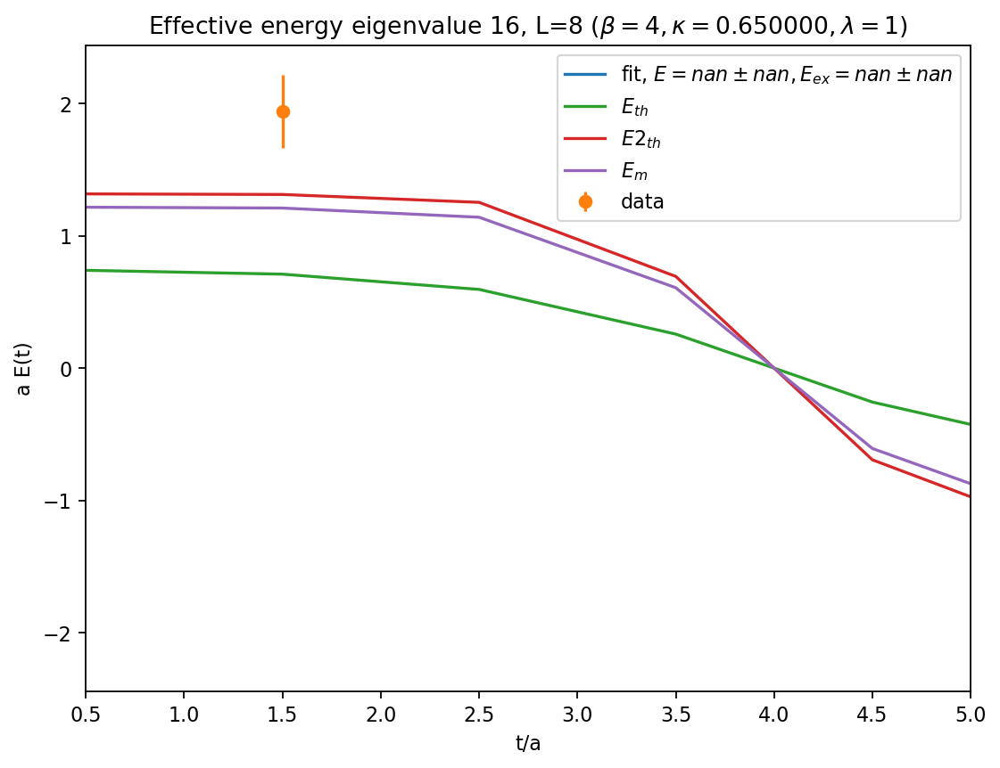

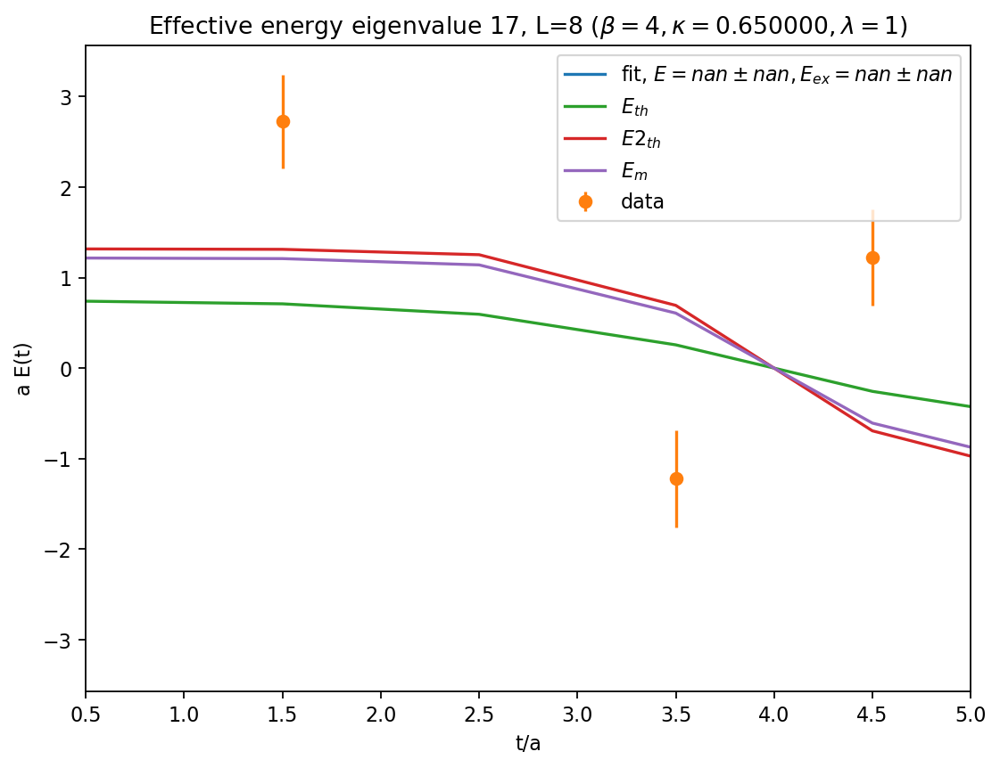

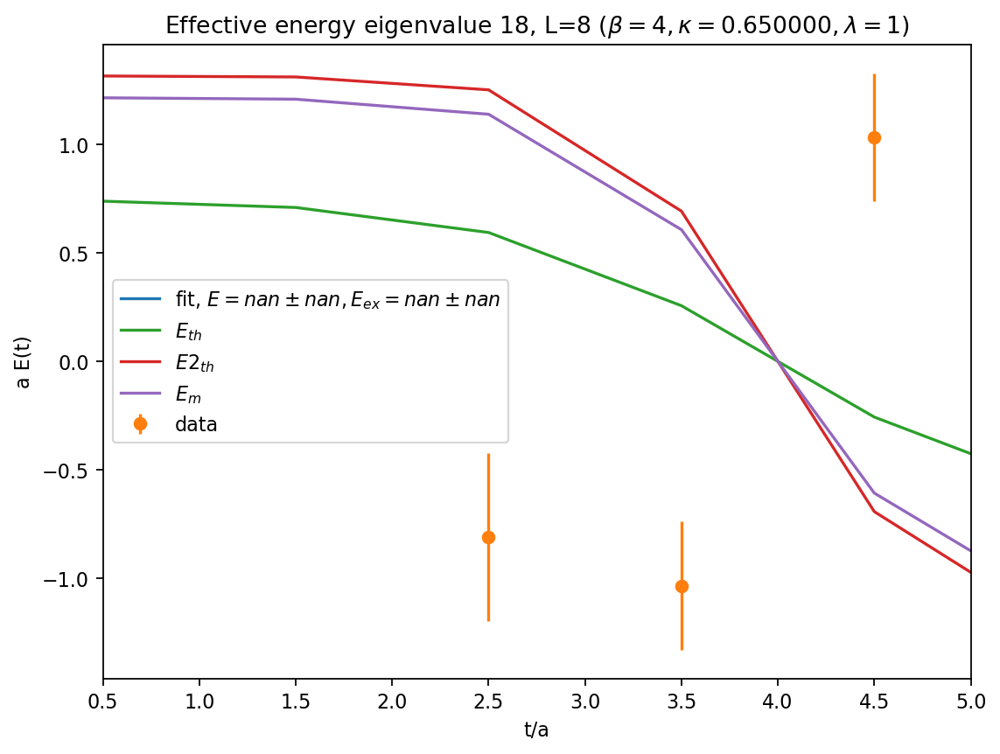

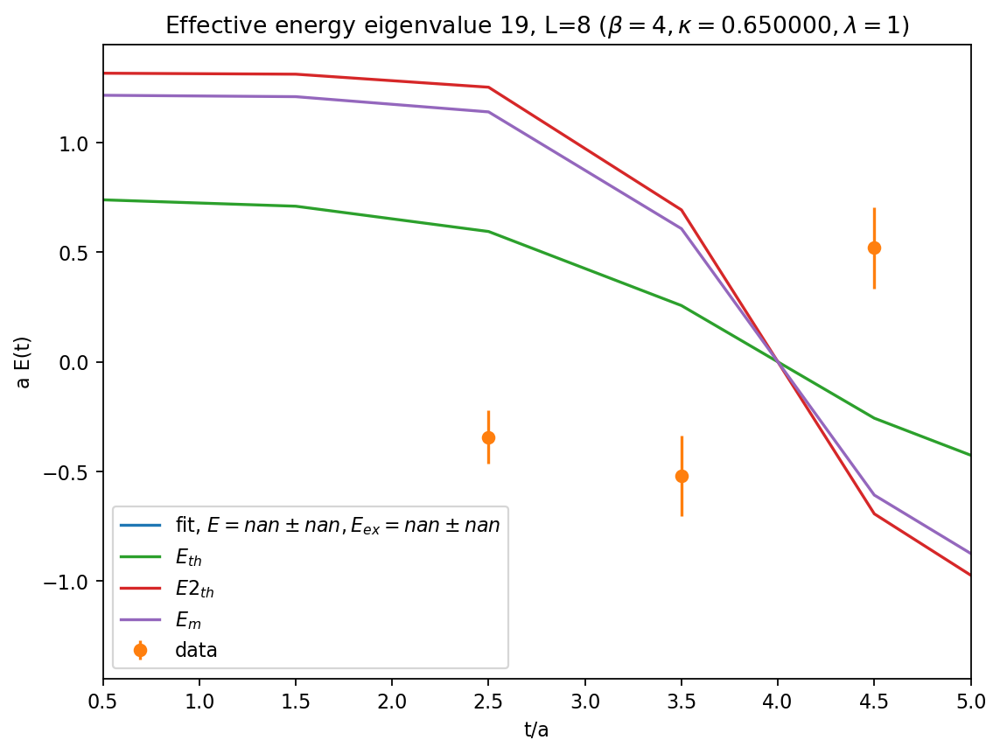

In [5]:
n_smear = 5
k_l=[0.65]
Nt_l= [8]
for Nt in Nt_l:
    for k in k_l:
        var_analysis_plot(k)

<ArgsView of Minuit at 55f475fb98d8>
  0.15934494829005108
  0.7988947668512368
  0.05924736551657095
  0.7991423834434486
<ErrorView of Minuit at 55f475fb98d8>
  a: 9.815631988686363
  b: 0.02413227683018032
  c: 8.259751508781768
  d: 0.3383804770937615
<ArgsView of Minuit at 55f476338b28>
  0.8402798527506478
  1.4818660514067252
  2.109058682870522
  0.008061666420151048
<ErrorView of Minuit at 55f476338b28>
  a: 9.441902561156876
  b: 0.10202378927669875
  c: 6.053669531658075
  d: 4.975838880995649
<ArgsView of Minuit at 55f47640da08>
  0.2146758909940999
  0.9431459358214775
  0.11143582927118645
  0.943119614196015
<ErrorView of Minuit at 55f47640da08>
  a: 8.8830128135986
  b: 0.2782796927896698
  c: 6.820564947834688
  d: 0.6717302697226748
<ArgsView of Minuit at 55f476338b28>
  nan
  nan
  nan
  nan
<ErrorView of Minuit at 55f476338b28>
  a: nan
  b: nan
  c: nan
  d: nan
<ArgsView of Minuit at 55f475fb98d8>
  0.1658310057095569
  0.7957071806790685
  0.059533052285548616
  

/home/vincenzo/Documents/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:268: RuntimeWarning: invalid value encountered in log


<ArgsView of Minuit at 55f47605e238>
  0.21318717372475426
  0.9244233878071099
  0.11032300963354114
  0.9241509755526822
<ErrorView of Minuit at 55f47605e238>
  a: 6.501558829525838
  b: 0.05699509021507276
  c: 7.480071580109257
  d: 1.1512564732355404
<ArgsView of Minuit at 55f47640dd08>
  nan
  nan
  nan
  nan
<ErrorView of Minuit at 55f47640dd08>
  a: nan
  b: nan
  c: nan
  d: nan
<ArgsView of Minuit at 55f475fb98d8>
  0.17370504553153643
  0.7971987027675614
  0.054876028688010114
  0.7973682575712646
<ErrorView of Minuit at 55f475fb98d8>
  a: 9.626022855171978
  b: 0.01645394221087859
  c: 9.755214426732543
  d: 0.3450137778969287
<ArgsView of Minuit at 55f476338b28>
  0.005596672161080063
  0.010978483213399781
  0.006701643275365821
  1.4813464129385965
<ErrorView of Minuit at 55f476338b28>
  a: 0.2043277314117367
  b: 1.9196511815903627
  c: 0.24374494924185613
  d: 0.04998423337436386
<ArgsView of Minuit at 55f475fb98d8>
  0.00023168901746584147
  1.1750744648930715
  0.19

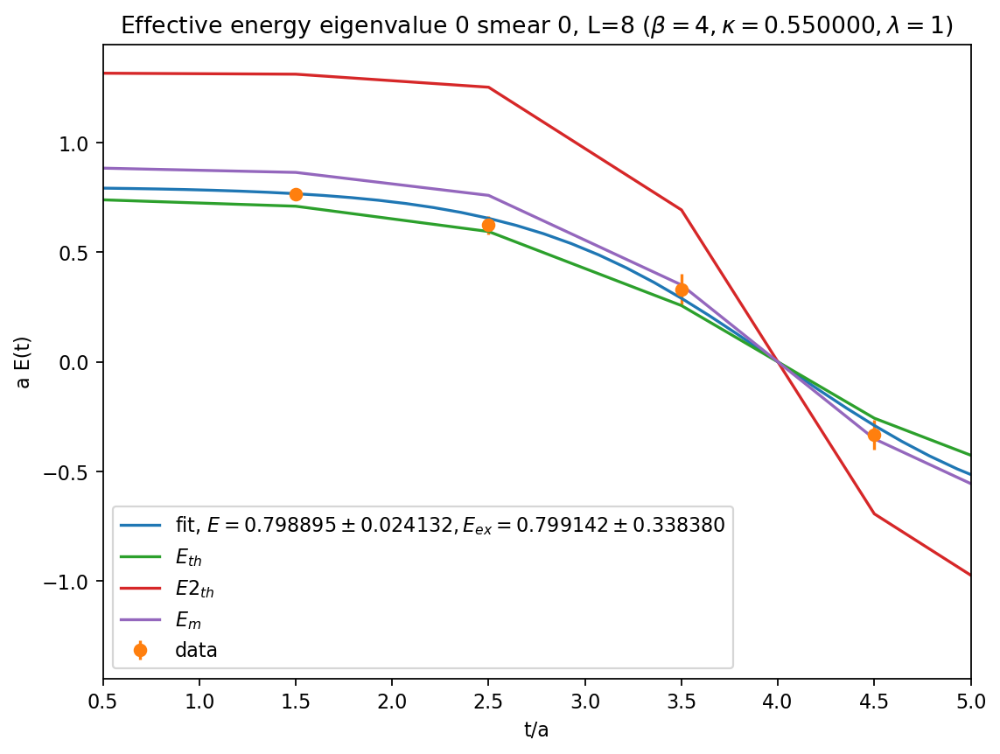

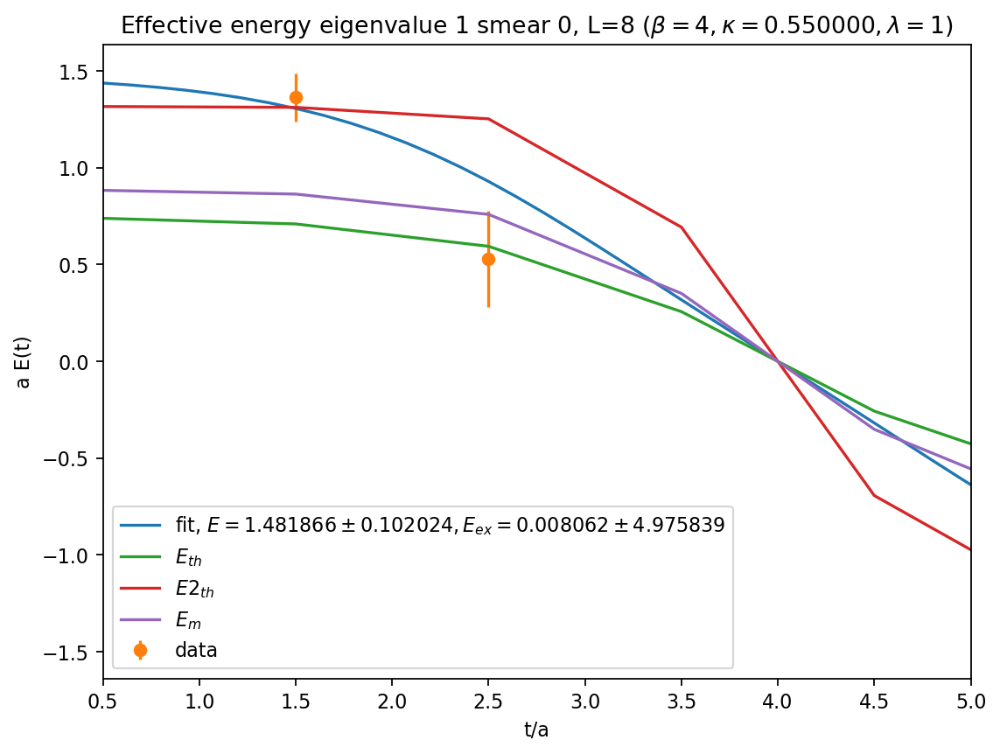

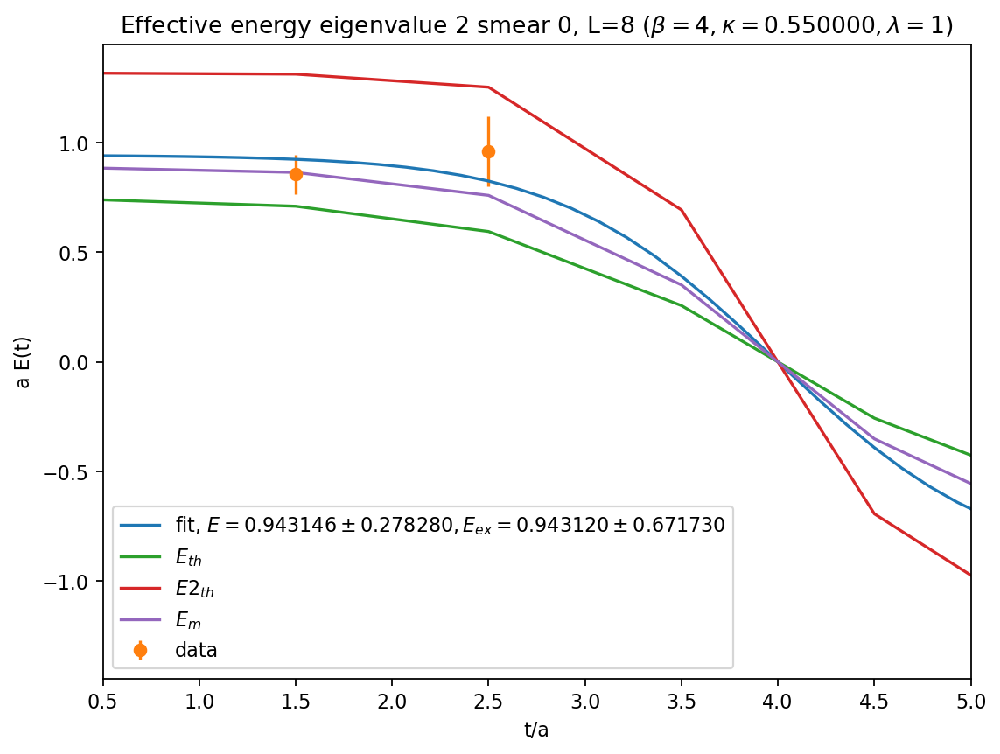

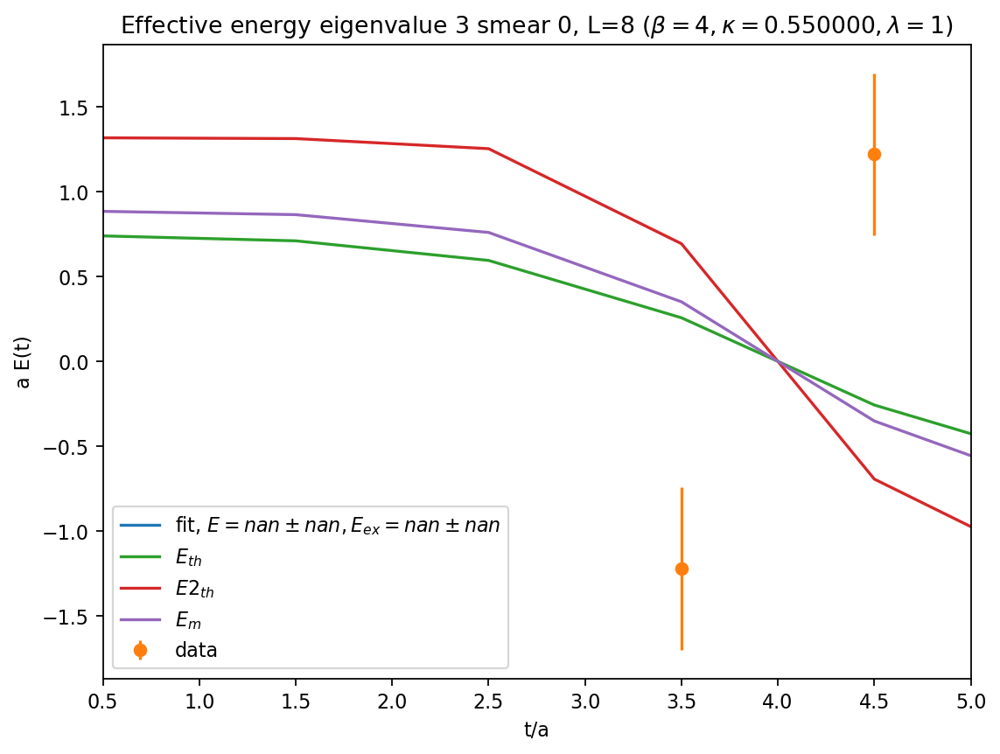

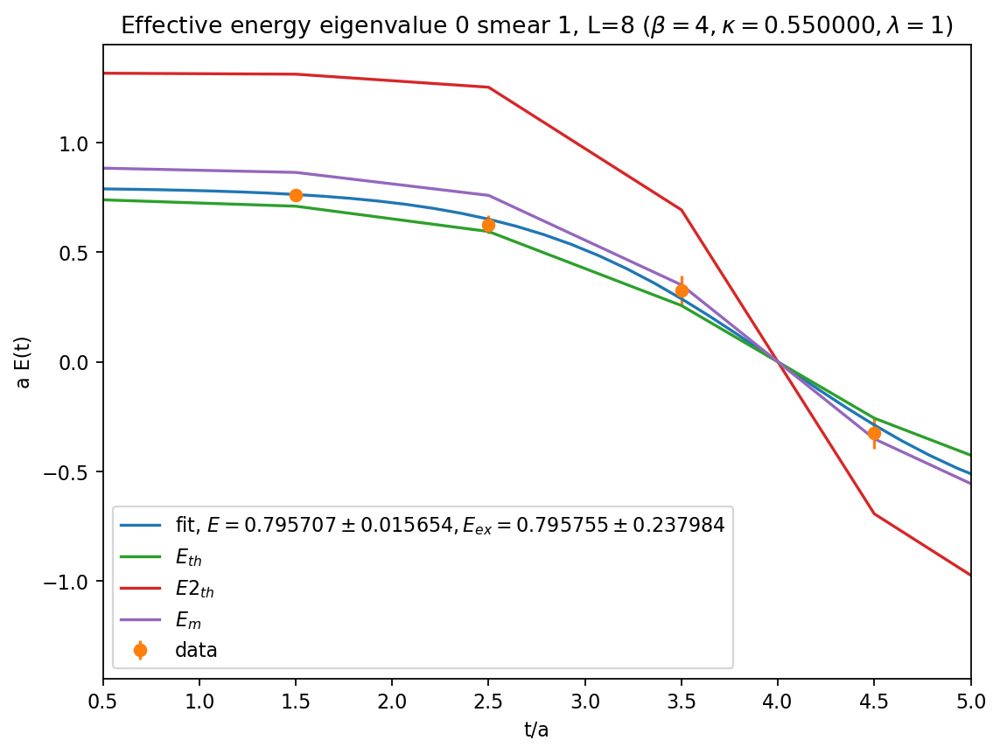

...

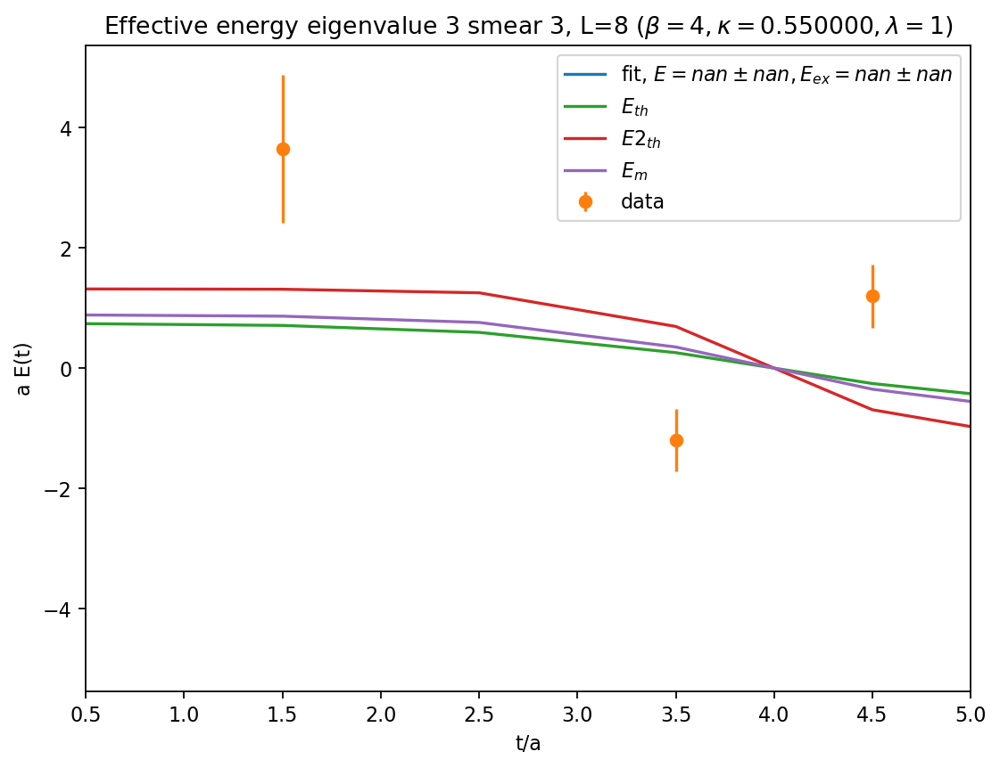

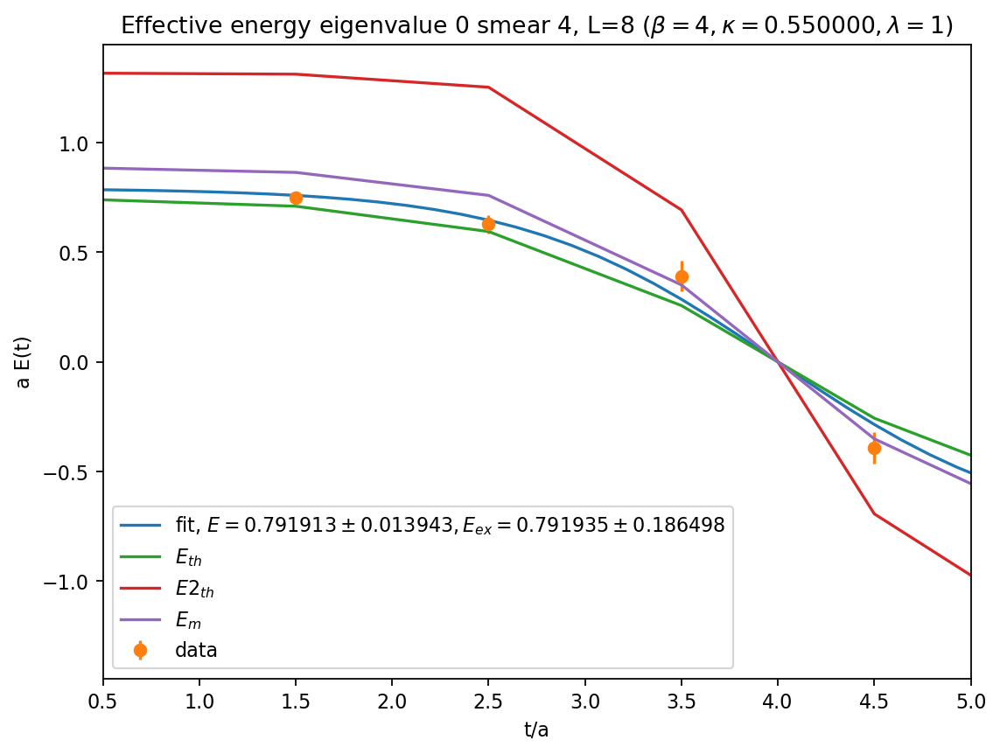

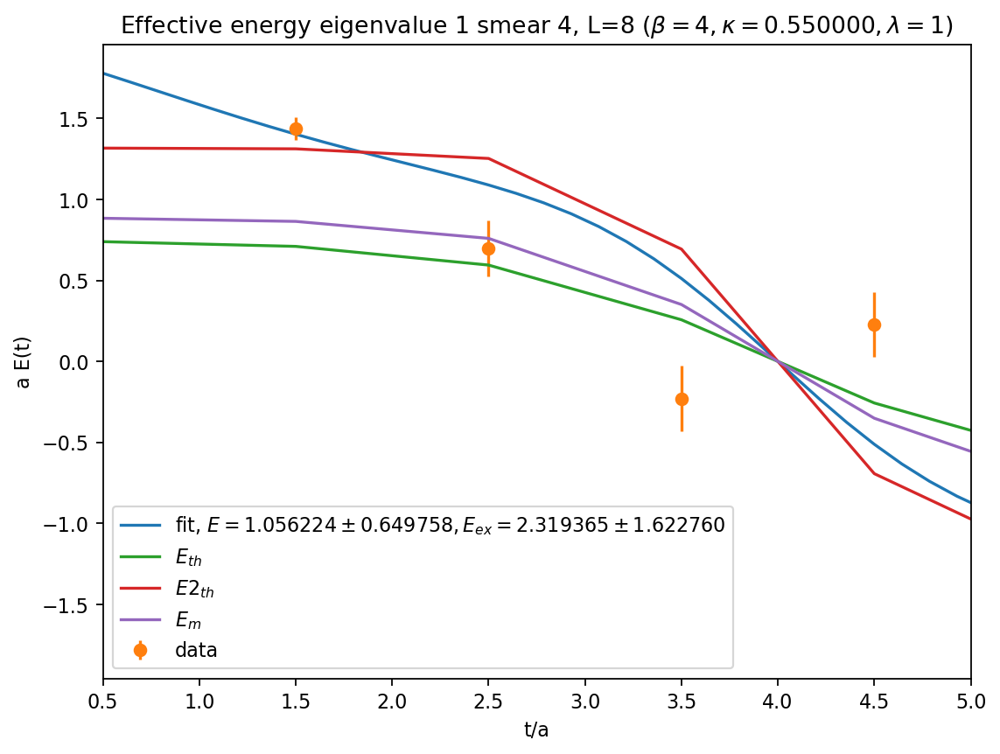

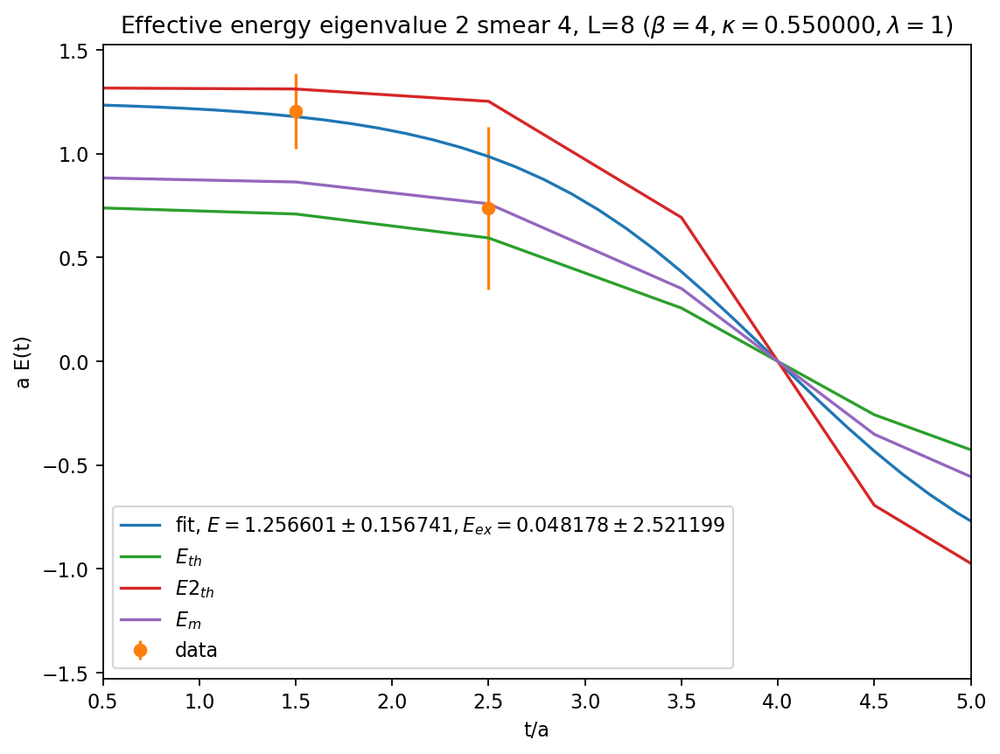

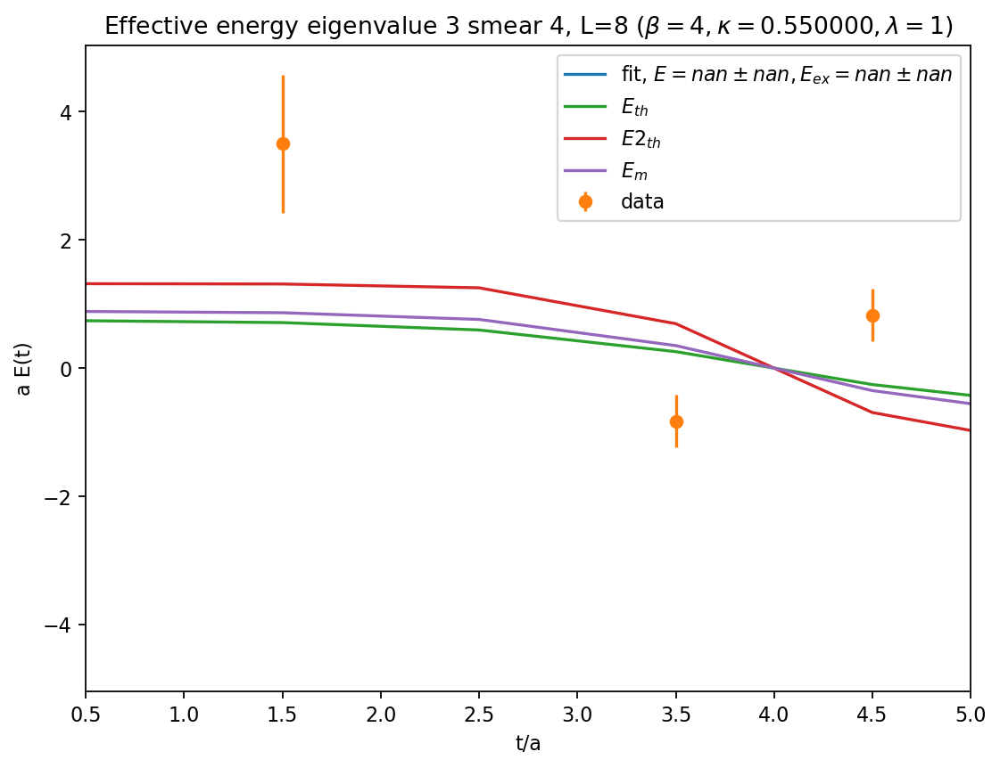

In [8]:
for Nt in [8]:
    for k in [0.55]:
        for sm in range(n_smear):
            var_analysis_plot4(k,sm)

<ArgsView of Minuit at 55f476329f38>
  0.3322280296717972
  0.7627130394151731
  0.05928570502809927
  0.764393936012297
<ErrorView of Minuit at 55f476329f38>
  a: 7.709709824073563
  b: 0.021718723591470424
  c: 9.970070810899122
  d: 0.8597347571510703
<ArgsView of Minuit at 55f47640dd08>
  0.028826369300352095
  1.3693735293971154
  0.019341585727983834
  0.007241998442233666
<ErrorView of Minuit at 55f47640dd08>
  a: 0.5725621095763905
  b: 0.03866091020153628
  c: 0.38831069674995444
  d: 4.959638692008763
<ArgsView of Minuit at 55f47605e238>
  0.01800153140741334
  1.4307931452561973
  0.028185135093184988
  0.8577248809601543
<ErrorView of Minuit at 55f47605e238>
  a: 1.82923409747315
  b: 1.1962869588683567
  c: 7.494052572012482
  d: 2.5067938918954558
<ArgsView of Minuit at 55f47605e238>
  0.2759796859363678
  0.7479300215850779
  0.04391112659173524
  0.7480445506811986
<ErrorView of Minuit at 55f47605e238>
  a: 8.782704579590305
  b: 0.008176053132002259
  c: 5.689588502025

/home/vincenzo/Documents/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:268: RuntimeWarning: invalid value encountered in log


<ArgsView of Minuit at 55f476329f38>
  nan
  nan
  nan
  nan
<ErrorView of Minuit at 55f476329f38>
  a: nan
  b: nan
  c: nan
  d: nan
<ArgsView of Minuit at 55f47640dd08>
  0.28106189168830564
  0.7424073046648311
  0.03933138314895945
  0.7427506938577353
<ErrorView of Minuit at 55f47640dd08>
  a: 8.32428956166811
  b: 0.010922804489878257
  c: 6.031938881961818
  d: 0.5679009925563623
<ArgsView of Minuit at 55f47605e238>
  0.4820605628462382
  0.026137657687788085
  1.586940269622124
  0.9874685084378737
<ErrorView of Minuit at 55f47605e238>
  a: 9.578295323208671
  b: 1.9855417261189372
  c: 5.318403848308547
  d: 0.07594634802014583
<ArgsView of Minuit at 55f476338b28>
  0.00012878817162165213
  1.10308223274845
  0.05805284112665454
  1.0808060953034517
<ErrorView of Minuit at 55f476338b28>
  a: 9.536661636306167
  b: 1.0043395590551256
  c: 6.434510402588771
  d: 0.03119852967792236
<ArgsView of Minuit at 55f47605e238>
  0.41412302959835556
  0.741786219168407
  0.05698332335025

/home/vincenzo/Documents/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:304: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<ArgsView of Minuit at 55f48c3bfce8>
  0.0162437696727169
  1.0067265775713916
  0.11642212409077535
  1.0078638707669647
<ErrorView of Minuit at 55f48c3bfce8>
  a: 6.454253439267039
  b: 1.4761208882177288
  c: 9.055958000837283
  d: 0.06315235205196335
<ArgsView of Minuit at 55f47616fda8>
  0.3985002433470136
  0.7462279453320189
  0.05685828138585258
  0.7467679976636068
<ErrorView of Minuit at 55f47616fda8>
  a: 6.163148648540811
  b: 0.005944974490543931
  c: 9.785872624454292
  d: 0.5606425992300959
<ArgsView of Minuit at 55f475fb98d8>
  0.3045132014585994
  0.772100598906952
  0.07110292897154091
  0.7727230778636346
<ErrorView of Minuit at 55f475fb98d8>
  a: 5.020412975911284
  b: 0.051995277915596994
  c: 9.785257486056528
  d: 2.8624897886912457
<ArgsView of Minuit at 55f476b9b858>
  nan
  nan
  nan
  nan
<ErrorView of Minuit at 55f476b9b858>
  a: nan
  b: nan
  c: nan
  d: nan
<ArgsView of Minuit at 55f475fb98d8>
  0.3222393836852028
  0.7833466541151183
  0.075782864452279


<ArgsView of Minuit at 55f476329f38>
  0.399439758853693
  0.7459600962655137
  0.056606659536794224
  0.7460259338239811
<ErrorView of Minuit at 55f476329f38>
  a: 8.740134085693295
  b: 0.005429830000875768
  c: 5.028300788968725
  d: 0.36187249067154675
<ArgsView of Minuit at 55f48c3bfce8>
  0.20000848168197027
  0.8154140844277354
  0.10756730345795551
  0.8164217302387844
<ErrorView of Minuit at 55f48c3bfce8>
  a: 5.077585468859745
  b: 0.09335987621630149
  c: 9.944771171302747
  d: 1.039755108945594
<ArgsView of Minuit at 55f476329f38>
  nan
  nan
  nan
  nan
<ErrorView of Minuit at 55f476329f38>
  a: nan
  b: nan
  c: nan
  d: nan


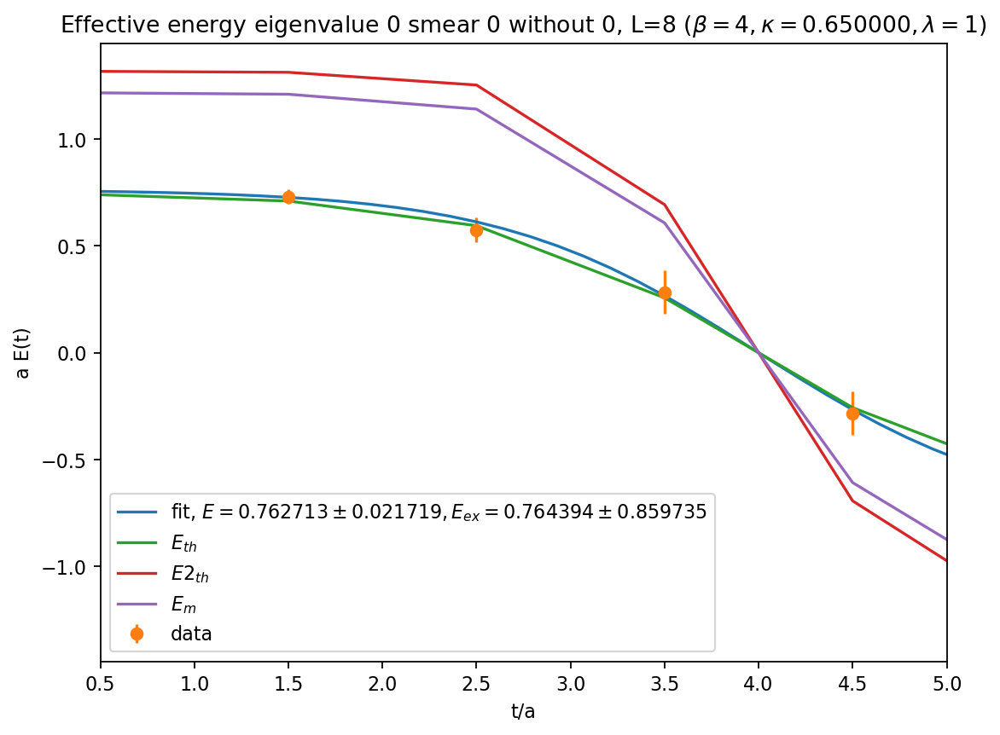

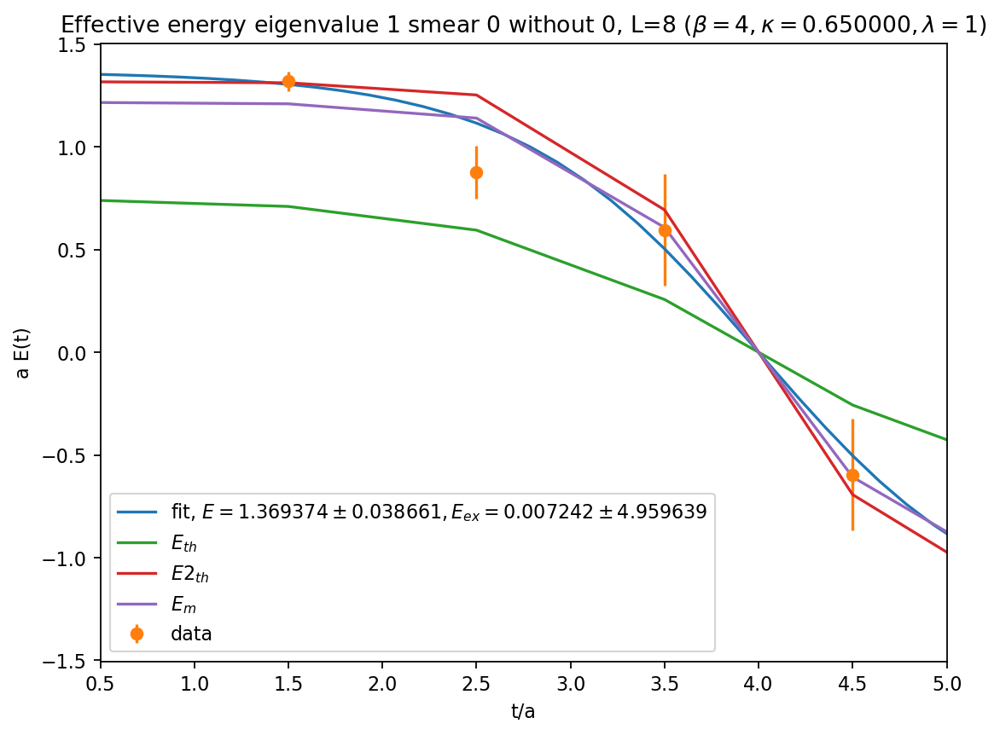

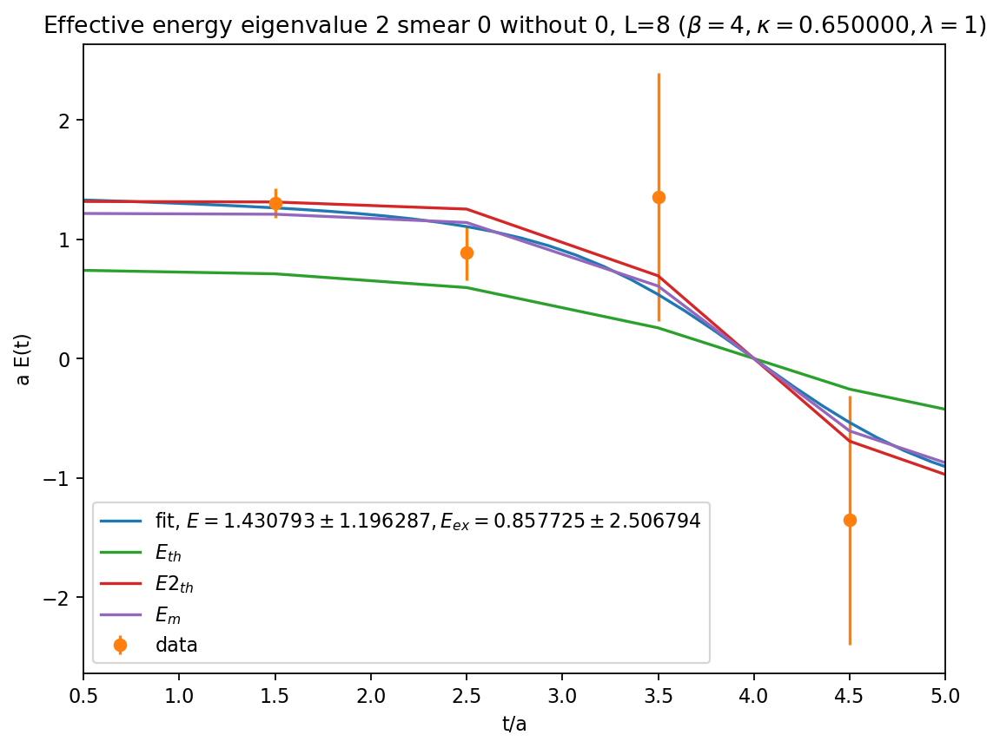

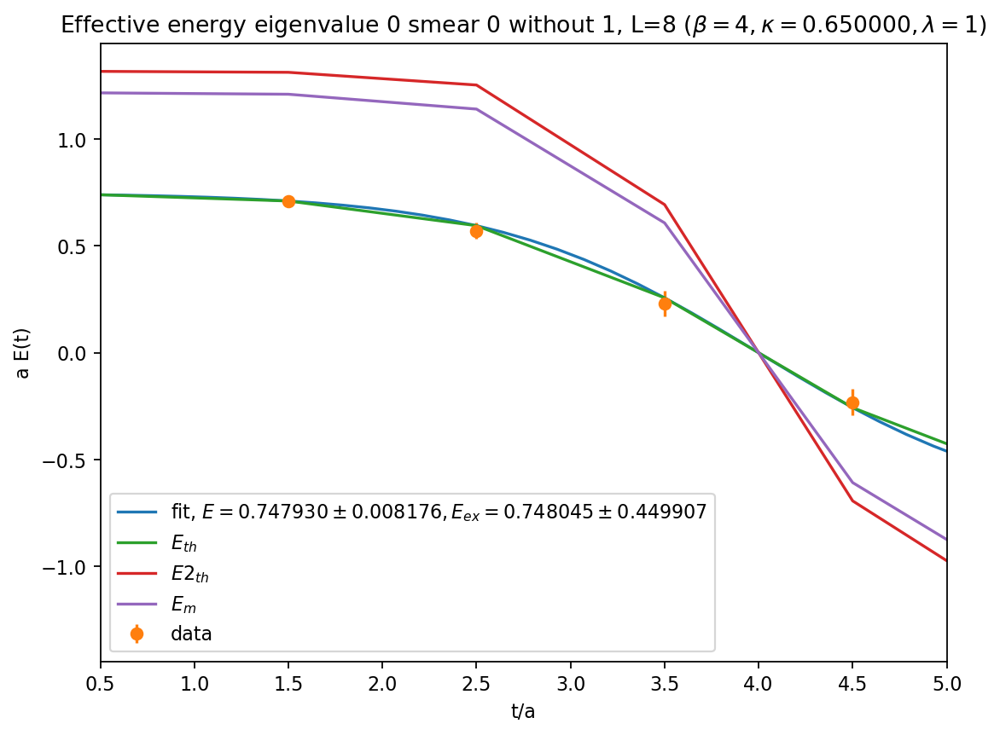

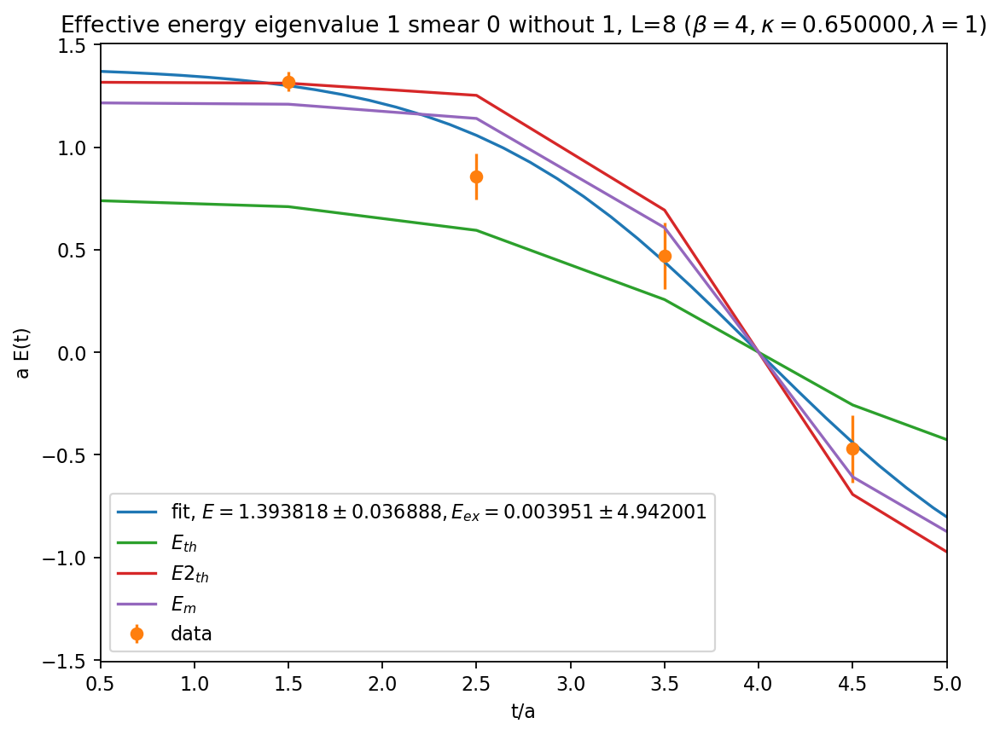

...

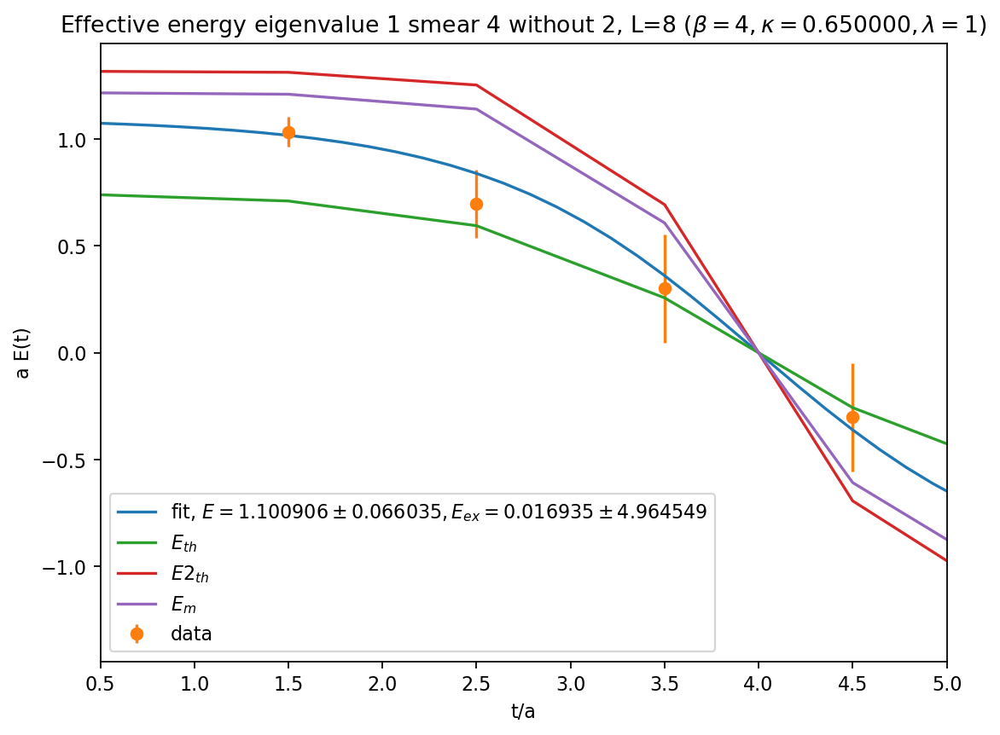

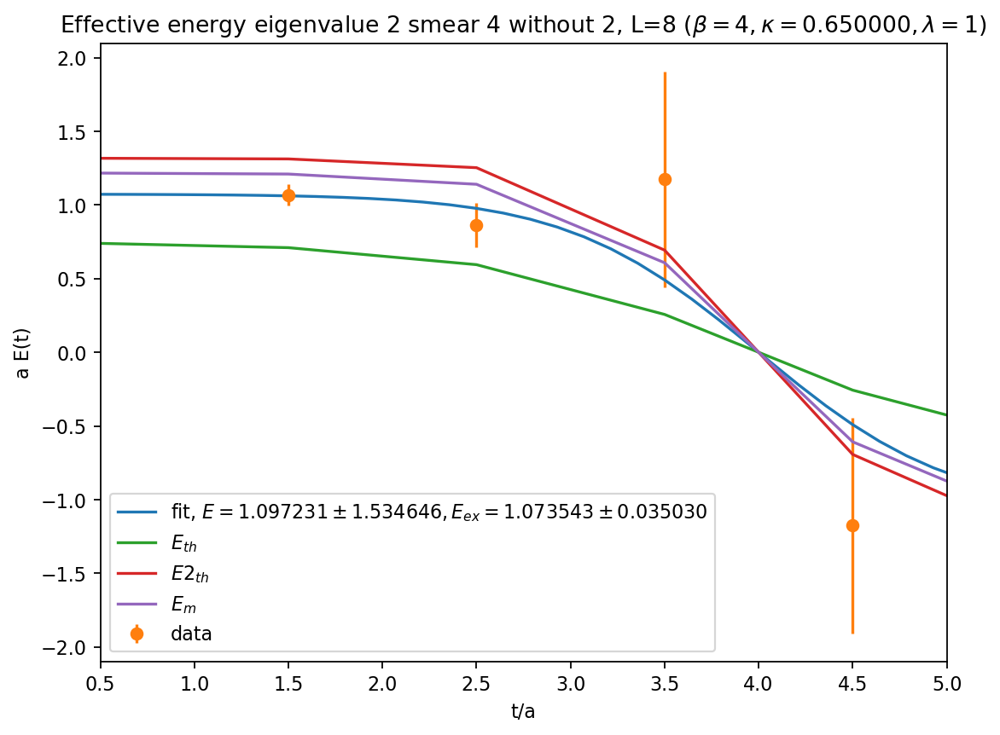

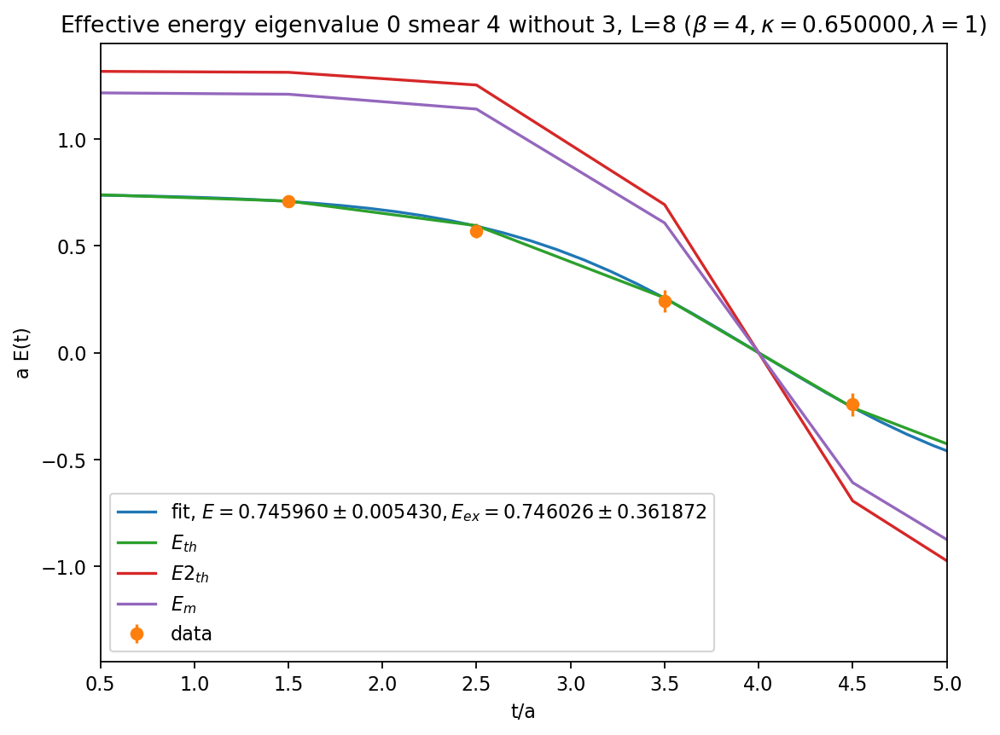

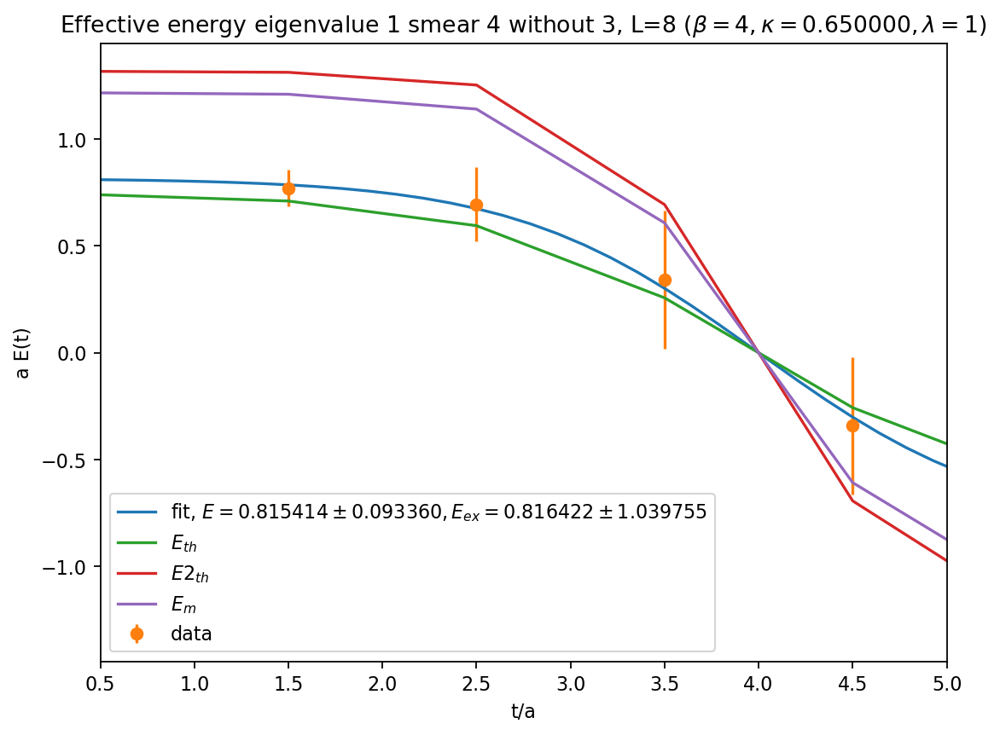

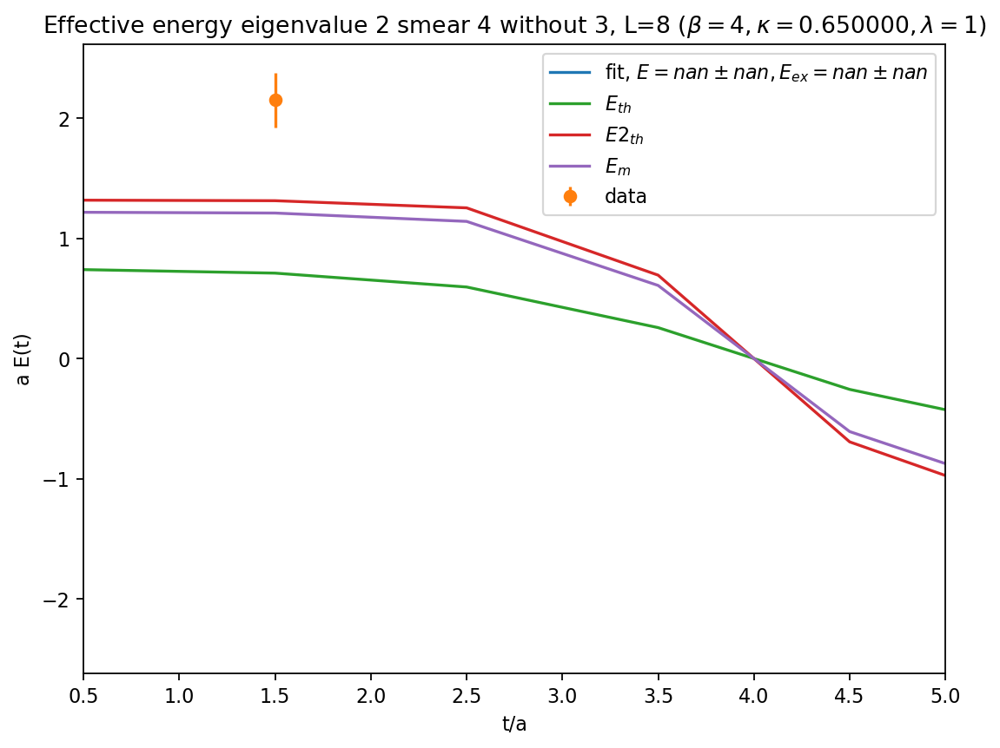

In [10]:
n_smear=5
for Nt in [8]:
    for k in [0.65]:
        for sm in range(n_smear):
            for op in range(n_op):
                var_analysis_plot3(k,sm,op)